In [1]:
#Import các thư viện cần thiết
import glob
import os
import librosa
import librosa.display
import matplotlib
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.pyplot import specgram
import tensorflow as tf
import numpy as np
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Convolution2D, MaxPooling2D
from keras.optimizers import SGD
from keras.regularizers import l2
from keras.utils import np_utils
from sklearn import metrics 
from keras.callbacks import EarlyStopping
%matplotlib inline
plt.style.use('ggplot')
#Định font cho đồ thị
plt.rcParams['font.family'] = 'serif'
plt.rcParams['font.serif'] = 'Ubuntu'
plt.rcParams['font.monospace'] = 'Ubuntu Mono'
plt.rcParams['font.size'] = 12
plt.rcParams['axes.labelsize'] = 11
plt.rcParams['axes.labelweight'] = 'bold'
plt.rcParams['axes.titlesize'] = 12
plt.rcParams['xtick.labelsize'] = 9
plt.rcParams['ytick.labelsize'] = 9
plt.rcParams['legend.fontsize'] = 11
plt.rcParams['figure.titlesize'] = 13

#Tắt ipynb warning
import warnings
warnings.filterwarnings('ignore')

Using TensorFlow backend.


In [2]:
#Load file âm thanh
def load_sound_files(file_paths):
    raw_sounds = []
    for fp in file_paths:
        X,sr = librosa.load(fp)
        raw_sounds.append(X)
    return raw_sounds

In [3]:
#Vẽ đồ thị sóng tần số
def plot_waves(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,60), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(10,1,i)
        librosa.display.waveplot(np.array(f),sr=22050)
        plt.title(n.title())
        i += 1
    plt.suptitle('Figure 1: Waveplot',x=0.5, y=0.915,fontsize=18)
    plt.show()
    

In [4]:
#Vẽ phổ đồ spectrogram
def plot_specgram(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,60), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(10,1,i)
        specgram(np.array(f), Fs=22050)
        plt.title(n.title())
        i += 1
    plt.suptitle('Figure 2: Spectrogram',x=0.5, y=0.915,fontsize=18)
    plt.show()

In [5]:
#Vẽ phổ đồ spectrogram với hàm log
def plot_log_power_specgram(sound_names,raw_sounds):
    i = 1
    fig = plt.figure(figsize=(25,60), dpi = 900)
    for n,f in zip(sound_names,raw_sounds):
        plt.subplot(10,1,i)
        D = librosa.logamplitude(np.abs(librosa.stft(f))**2, ref_power=np.max)
        librosa.display.specshow(D,x_axis='time' ,y_axis='log')
        plt.title(n.title())
        i += 1
    plt.suptitle('Figure 3: Log power spectrogram',x=0.5, y=0.915,fontsize=18)
    plt.show()

In [6]:
#Các âm thanh đại diện
sound_file_paths = ["57320-0-0-7.wav","24074-1-0-3.wav","15564-2-0-1.wav","31323-3-0-1.wav","46669-4-0-35.wav",
                   "89948-5-0-0.wav","40722-8-0-4.wav","103074-7-3-2.wav","106905-8-0-0.wav","108041-9-0-4.wav"]
sound_names = ["air conditioner","car horn","children playing","dog bark","drilling","engine idling",
               "gun shot","jackhammer","siren","street music"]

raw_sounds = load_sound_files(sound_file_paths)

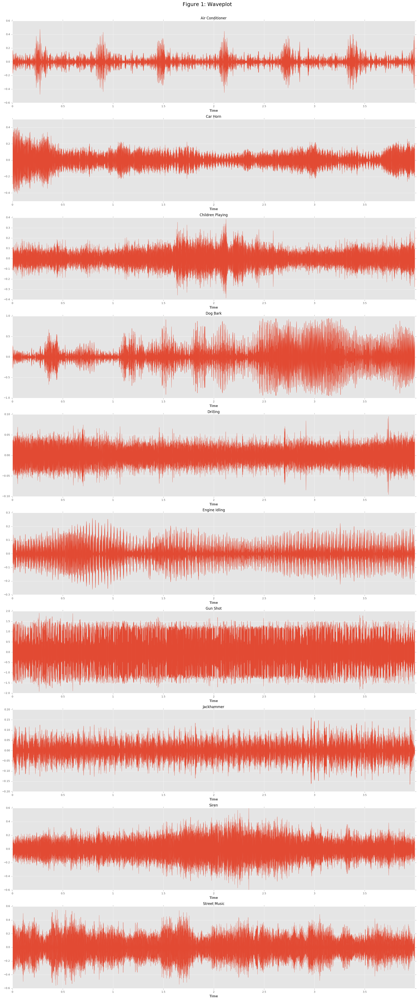

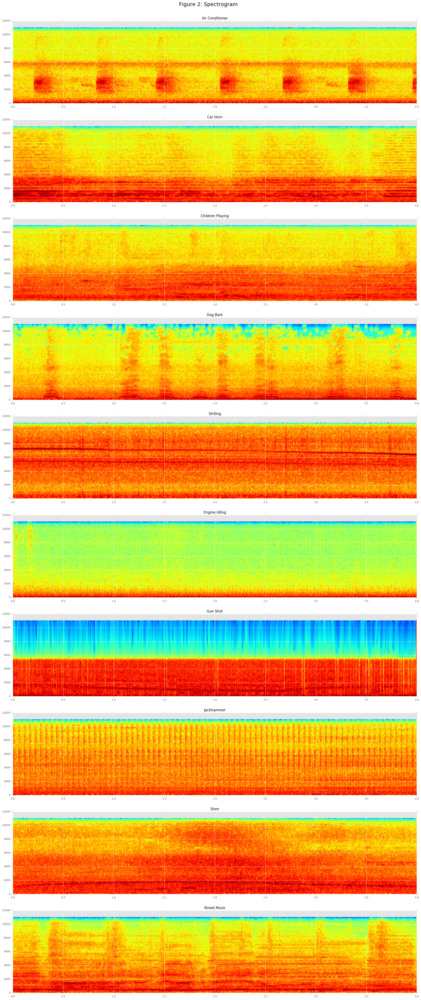

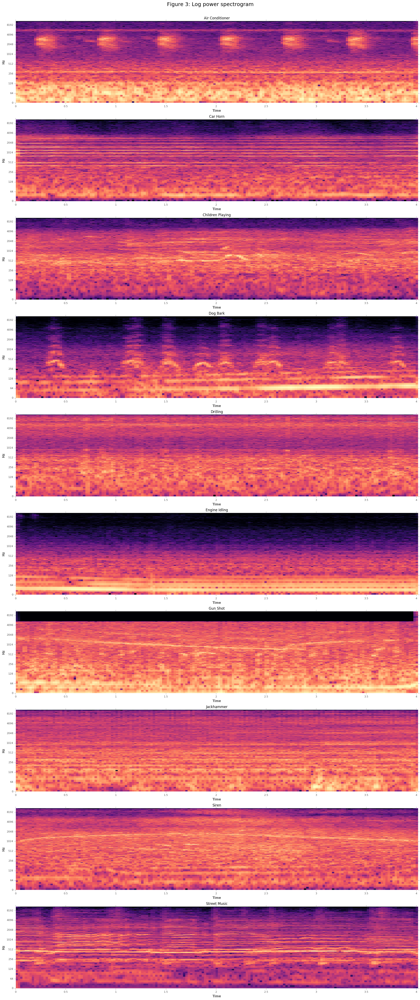

In [7]:
#Hiển thị các đồ thị và phổ đồ qua matplotlib
plot_waves(sound_names,raw_sounds)
plot_specgram(sound_names,raw_sounds)
plot_log_power_specgram(sound_names,raw_sounds)

In [8]:
#Khởi tạo cửa sổ trượt
def windows(data, window_size):
    start = 0
    while start < len(data):
        yield start, start + window_size
        start += (window_size / 2)

In [9]:
#Rút nhãn  và đặc trưng cơ bản (raw spectrogram)
def extract_features(parent_dir,sub_dirs,file_ext="*.wav",bands = 60, frames = 41):
    window_size = 512 * (frames - 1)
    log_specgrams = []
    labels = []
    for l, sub_dir in enumerate(sub_dirs):
        for fn in glob.glob(os.path.join(parent_dir, sub_dir, file_ext)):
            sound_clip,s = librosa.load(fn)
            label = fn.split('-')[2]
            for (start,end) in windows(sound_clip,window_size):
                if(len(sound_clip[start:end]) == window_size):
                    signal = sound_clip[start:end]
                    melspec = librosa.feature.melspectrogram(signal, n_mels = bands)
                    logspec = librosa.logamplitude(melspec)
                    logspec = logspec.T.flatten()[:, np.newaxis].T
                    log_specgrams.append(logspec)
                    labels.append(label)
            
    log_specgrams = np.asarray(log_specgrams).reshape(len(log_specgrams),bands,frames,1)
    features = np.concatenate((log_specgrams, np.zeros(np.shape(log_specgrams))), axis = 3)
    for i in range(len(features)):
        features[i, :, :, 1] = librosa.feature.delta(features[i, :, :, 0])
    
    return np.array(features), np.array(labels,dtype = np.int)

In [10]:
#Phân loại nhãn cho từng đặc trưng
def one_hot_encode(labels):
    n_labels = len(labels)
    n_unique_labels = len(np.unique(labels))
    print(n_unique_labels)
    one_hot_encode = np.zeros((n_labels,n_unique_labels))
    for labeled in range(n_labels):
        one_hot_encode[labeled][labels[labeled]] = 1
    return one_hot_encode

In [11]:
#Thực hiện load âm thanh và biểu diễn spectrogram cho từng đoạn âm thanh
parent_dir = 'Sound-Data'
sub_dirs= ['fold1', 'fold2', 'fold3', 'fold4', 'fold5', 'fold6', 'fold7', 'fold8', 'fold9', 'fold10']
#sub_dirs= ['fold1']
features,labels = extract_features(parent_dir,sub_dirs)
labels = one_hot_encode(labels)

10


In [21]:
#Chia dữ liệu thành các tập: tập huấn luyện (train), tập kiểm thử (test), tập kiểm huấn luyện (validation)
rnd_indices = np.random.rand(len(labels)) < 0.20
train_x = features[~rnd_indices]
train_y = labels[~rnd_indices]
hold_x = features[rnd_indices]
hold_y = labels[rnd_indices]
hold_indices = np.random.rand(len(hold_x)) < 0.50
test_x = hold_x[~hold_indices]
test_y = hold_y[~hold_indices]
valid_x = hold_x[hold_indices]
valid_y = hold_y[hold_indices]

In [13]:
# Xử lý rời rạc hóa phổ đồ
frames = 41
bands = 60
num_channels = 2
num_labels = test_y.shape[1]

#Kích thước Gaussian filter = 3x3
f_size = 3

#Khởi tại mô hình học
model = Sequential()
#Xử lý 5 layer của CNN (3 layer tích chập - 1 layer liên kết đầy đủ - 1 layer phân loại (lớp xuất))
# Layer 1 (24 nodes)
model.add(Convolution2D(24, f_size, f_size, border_mode='same', input_shape=(bands, frames, num_channels)))
model.add(MaxPooling2D(pool_size=(4, 2)))
model.add(Activation('relu'))

# Layer 2 (48 node)
model.add(Convolution2D(48, f_size, f_size, border_mode='same'))
model.add(MaxPooling2D(pool_size=(4, 2)))
model.add(Activation('relu'))

# Layer 3 - không dùng pooling (48 nodes)
model.add(Convolution2D(48, f_size, f_size, border_mode='valid'))
model.add(Activation('relu'))

# Làm phẳng chiều dữ liệu
model.add(Flatten())

# Layer 4 - liên kết đầy đủ (64 nodes)
model.add(Dense(64, W_regularizer=l2(0.001)))
model.add(Activation('relu'))
model.add(Dropout(0.5))

# Layer 5 - layer phân loại (lớp xuất) (10 nodes ứng với 10 nhãn dữ liệu)
model.add(Dense(num_labels, W_regularizer=l2(0.001)))
model.add(Dropout(0.5))
model.add(Activation('softmax'))



In [25]:

# Sử dụng thuật toán gradient descent giảm ngẫu nhiên (SGD - Stochastic Gradient Descent)
sgd = SGD(lr=0.001, momentum=0.0, decay=0.0, nesterov=False)

# Early stoping
earlystop = EarlyStopping(monitor='val_loss', patience=1, verbose=0, mode='auto')

# Áp dụng lan truyền ngược để huấn luyện
# Fit model
model.compile(loss='categorical_crossentropy', metrics=['accuracy'], optimizer=sgd)

model.fit(train_x, train_y, validation_data=(valid_x, valid_y), callbacks=[earlystop], batch_size=32, nb_epoch=50)


Train on 43209 samples, validate on 5314 samples
Epoch 1/50
43209/43209 [==============================] - 110s - loss: 1.5326 - acc: 0.4630 - val_loss: 0.9697 - val_acc: 0.7439
Epoch 2/50
43209/43209 [==============================] - 113s - loss: 1.5289 - acc: 0.4675 - val_loss: 0.9373 - val_acc: 0.7614
Epoch 3/50
43209/43209 [==============================] - 112s - loss: 1.5259 - acc: 0.4652 - val_loss: 0.9345 - val_acc: 0.7742
Epoch 4/50
43209/43209 [==============================] - 111s - loss: 1.5105 - acc: 0.4690 - val_loss: 0.8699 - val_acc: 0.7855
Epoch 5/50
43209/43209 [==============================] - 106s - loss: 1.5035 - acc: 0.4706 - val_loss: 1.0899 - val_acc: 0.7036
Epoch 6/50
43209/43209 [==============================] - 108s - loss: 1.4940 - acc: 0.4741 - val_loss: 0.8507 - val_acc: 0.7977
Epoch 7/50
43209/43209 [==============================] - 111s - loss: 1.4985 - acc: 0.4720 - val_loss: 0.8457 - val_acc: 0.7919
Epoch 8/50
43209/43209 [========================

In [26]:
# Phân loại tập kiểm thử (test)
def categorical_probas_to_classes(p):
    return np.argmax(p, axis = 1)
def probas_to_classes(y_pred):
    if len(y_pred.shape) > 1 and y_pred.shape[1] > 1:
        return categorical_probas_to_classes(y_pred)
    return np.array([1 if p > 0.5 else 0 for p in y_pred])
# Dự đoán tập kiểm thử
y_prob = model.predict_proba(test_x, verbose=0)
y_pred = probas_to_classes(y_prob)
y_true = np.argmax(test_y, 1)
roc = metrics.roc_auc_score(test_y, y_prob)
#print ("ROC:", round(roc,3))

# Tính độ chính xác
print(len(test_x))
score, accuracy = model.evaluate(test_x, test_y, batch_size=32)
print("\n Độ chính xác: {:.2f}".format(accuracy))


5535
5535/5535 [==============================] - 4s     

 Độ chính xác: 0.78
